# BES AGM 2024
*aka the one where I apply ML to global data in the past and future to see to what extent it all works*

### To do
1. Generate static statistics from historical and future data:
    - ~~Buffer datasets via LOESS~~
    - Derive stats: seasonal min, max, standard deviation, kurtosis
        - Currently sticking with old ones since new are a pain
2. Train/test classifier on GBR
    - Sort out land mask
3. Train/test classifier globally
4. Plot of test-train split accuracy with test cell size

### Nice to haves
1. Get aragonite properly:
    - pH
    - DIC
    - ~(salinity and temperature already)~
2. More years of Kd490 (fairly easy, since downloading locally)
3. Sea floor values! Could visualise the difference here with a visual, rather than actually having used them, in order to communicate the value of models
4. Calculate PAR from bathymetry and Kd490 or leave as rsdo and bathymetry?

### Future work
1. Further, physics-informed parameterisations e.g. cumulative heating effects e.g. DHWs
2. Using seafloor values


### Meta to do
1. Cornwall papers
2. Tidy up `threshold.ipynb`
3. Refine PAR calculation
4. Push most recent code from `coralshift` and `cmipper`
5. Longer-term (over Christmas/into new year): look into cursor and more integrated AI tools to tighten up whole-code projects. Will be good timing for refactoring `coralshift` and releasing `threshold`

In [54]:
%load_ext autoreload
%autoreload 2

import os
os.environ['OMP_NUM_THREADS'] = "196"

# file ops
from datetime import datetime
from pathlib import Path
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings(action="ignore", category=RuntimeWarning)

# spatial
import xarray as xa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import rioxarray
import cartopy.crs as ccrs

# machine learning
from dask.distributed import get_client, Client, LocalCluster, SSHCluster
from concurrent.futures import ThreadPoolExecutor
import xgboost as xgb

# custom
from coralshift.utils import file_ops, config, utils, thresholding
from coralshift.utils.config import Config
from coralshift.dataloading import get_data
# from coralshift.plotting import spatial_plots, visualise_results
from coralshift.machine_learning import static_models, run_model, ml_results
from coralshift.processing import ml_processing
from coralshift.processing import spatial_data

from tqdm.auto import tqdm
import cmipper
from graphpy import spatial as graphpy_spatial
from graphpy import colours as graphpy_colours
import cmipper.utils as cmipper_utils

# data fps
gt_data_dir = config.gt_data_dir
config_info = file_ops.read_yaml(config.config_dir / "config_test.yaml")
config_class = Config(config_info)

# specific areas
cs_lats = [-30, 0]
cs_lons = [130, 170]
japan_lats = [30, 45]
japan_lons = [130, 150]
tight_cs_lons = [141.5, 144.5]
tight_cs_lats = [-12.5, -10]
# load core data
unep_bathymetry = xa.open_dataset(Path("/maps/rt582/coralshift/data/rcuk24") / "bathymetry_unep_0-25_S90-0_N90-0_W180-0_E180-0_regular.nc")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load data

In [2]:
# load historical environmental data
AWI_data_dir = Path("/maps/rt582/cmipper/.esgpull/data/CMIP6/CMIP/AWI/AWI-CM-1-1-MR/historical/r1i1p1f1/Omon")
rsdo_historical = spatial_data.process_xa_d(xa.open_mfdataset((AWI_data_dir / "rsdo/gn/v20181218/remapped").glob("*.nc")))
tos_historical = spatial_data.process_xa_d(xa.open_mfdataset((AWI_data_dir / "tos/gn/v20181218/remapped").glob("*.nc")))
so_historical = spatial_data.process_xa_d(xa.open_mfdataset((AWI_data_dir / "so/gn/v20181218/remapped").glob("*.nc"))).isel(depth=0).drop_vars(["depth"])
# thetao_historical =  spatial_data.process_xa_d(xa.open_mfdataset((AWI_data_dir / "thetao/gn/v20181218/remapped").glob("*.nc"))).isel(depth=0).drop_vars(["depth"])    # same as tos at surface

# TODO: compute par
kd490 = spatial_data.process_xa_d(xa.open_mfdataset(Path("/maps/rt582/cmipper/notebooks/dev/ocean_colour_2022/remapped").glob("*.nc")).mean("time")["kd_490"])

# delta_elevation = 0.2
# par_historical = thresholding.calc_par(unep_bathymetry.elevation.where(unep_bathymetry.elevation >= -100, np.nan), rsdo_historical.rsdo, kd490)


CSIRO_data_dir = Path("/maps/rt582/cmipper/.esgpull/data/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/historical/r1i1p1f1/Omon")
arag_historical = spatial_data.process_xa_d(xa.open_mfdataset((CSIRO_data_dir / "arag/gn/v20191115/remapped").glob("*.nc"))).isel(depth=0).drop_vars(["depth"])
no3_historical = spatial_data.process_xa_d(xa.open_mfdataset((CSIRO_data_dir / "no3/gn/v20191115/remapped").glob("*.nc"))).isel(depth=0).drop_vars(["depth"])
po4_historical = spatial_data.process_xa_d(xa.open_mfdataset((CSIRO_data_dir / "po4/gn/v20191115/remapped").glob("*.nc"))).isel(depth=0).drop_vars(["depth"])
# # TODO: calculate par?
datasets = [rsdo_historical, tos_historical, so_historical, arag_historical, no3_historical, po4_historical]
all_historical = xa.merge(datasets)
# drop lev_bnds
all_historical = all_historical.drop_vars(["lev_bnds"])
all_historical

<xarray.Dataset> Size: 49GB
Dimensions:    (time: 1980, longitude: 1440, latitude: 720)
Coordinates:
  * time       (time) datetime64[ns] 16kB 1850-01-16T12:00:00 ... 2014-12-16T...
  * longitude  (longitude) float64 12kB -180.0 -179.8 -179.5 ... 179.5 179.8
  * latitude   (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
Data variables:
    rsdo       (time, latitude, longitude) float32 8GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    tos        (time, latitude, longitude) float32 8GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    so         (time, latitude, longitude) float32 8GB dask.array<chunksize=(1, 182, 1440), meta=np.ndarray>
    arag       (time, latitude, longitude) float32 8GB dask.array<chunksize=(1, 182, 1440), meta=np.ndarray>
    no3        (time, latitude, longitude) float32 8GB dask.array<chunksize=(1, 182, 1440), meta=np.ndarray>
    po4        (time, latitude, longitude) float32 8GB dask.array<chunksize=(1, 182, 1440), meta=np.ndarray>
Attributes: (12/43)
    CDI:                       Climate Data Interface version 2.4.0 (https://...
    Conventions:               CF-1.7 CMIP-6.2
    source:                    AWI-CM-1-1-MR
    institution:               Alfred Wegener Institute, Helmholtz Centre for...
    activity_id:               CMIP
    creation_date:             2018-12-18T12:00:00Z
    ...                        ...
    parent_source_id:          AWI-CM-1-1-MR
    parent_time_units:         days since 2401-1-1
    parent_variant_label:      r1i1p1f1
    history:                   Sun Nov 24 11:28:02 2024: cdo -P 128 remapcon,...
    CDO:                       Climate Data Operators version 2.4.0 (https://...
    cdo_openmp_thread_number:  128

In [92]:
bathymetry_rise = unep_bathymetry.elevation

# create time series with 0.2m rise in bathymetry since 1880
def create_slr_correction(time, slr_start_year=1880, slr_end_year=2015, total_rise=0.2):
    correction = np.zeros_like(time, dtype=np.float32)
    slr_years = (time >= np.datetime64(f"{slr_start_year}")) & (time <= np.datetime64(f"{slr_end_year}"))
    if np.any(slr_years):
        time_years = (time[slr_years] - np.datetime64(f"{slr_start_year}")).astype('timedelta64[Y]').astype(int)
        correction[slr_years] = (time_years / (slr_end_year - slr_start_year)) * total_rise
    return correction

historical_time = all_historical.time
# Generate the correction factor
historic_slr_correction = xa.DataArray(
    create_slr_correction(historical_time.values),
    dims="time",
    coords={"time": historical_time},
    name="sea_level_correction"
)

historical_bathymetry = unep_bathymetry.elevation - historic_slr_correction
par_historical = thresholding.calc_par(historical_bathymetry.where(unep_bathymetry.UNEP_GDCR == 1), rsdo_historical.rsdo, kd490)
# par_historical = par_historical.where(unep_bathymetry.elevation >= -100)    # TODO: TMP FIX


In [93]:
resmip_time = resmip_da.time
resmip_slr_correction = xa.DataArray(
    create_slr_correction(resmip_time.values, slr_start_year=2015, slr_end_year=2101, total_rise=0.8),
    dims="time",
    coords={"time": resmip_time},
    name="sea_level_correction"
)
resmip_bathymetry = historical_bathymetry.isel(time=-1) - resmip_slr_correction

In [94]:
# calculate par with dynamic bathymetry
par_resmip = thresholding.calc_par(resmip_bathymetry, rsdo_resmip.rsdo, kd490)
# par_resmip = par_resmip.where(unep_bathymetry.elevation >= -100)
par_resmip = par_resmip.where(unep_bathymetry.UNEP_GDCR == 1)

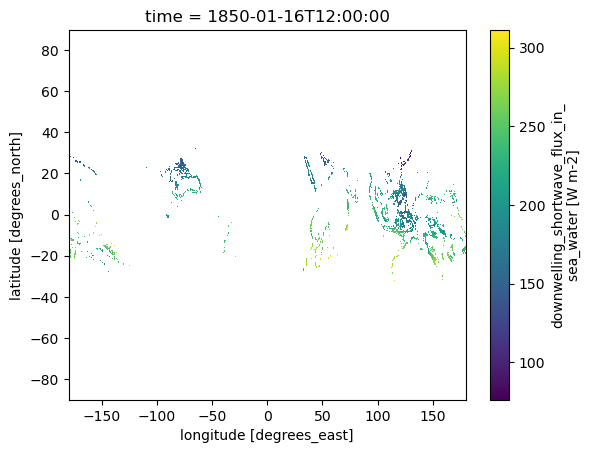

In [ ]:
# calculate par in reef cells
rsdo_historical.where(unep_bathymetry.UNEP_GDCR == 1).isel(time=0).rsdo.plot()

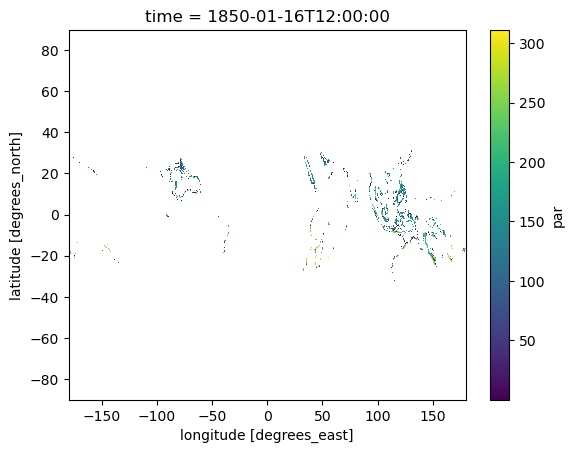

In [9]:
par.where(unep_bathymetry.UNEP_GDCR == 1).isel(time=0).par.plot()

In [ ]:
# all_stats = ml_processing.calculate_statistics(all_historical, vars=all_historical.data_vars, years_window=[1850, 1950])
all_stats

<xarray.Dataset> Size: 995MB
Dimensions:              (latitude: 720, longitude: 1440)
Coordinates:
  * latitude             (latitude) float64 6kB -90.0 -89.75 ... 89.5 89.75
  * longitude            (longitude) float64 12kB -180.0 -179.8 ... 179.5 179.8
Data variables: (12/240)
    rsdo_january_mean    (latitude, longitude) float32 4MB nan nan ... 0.0 0.0
    rsdo_february_mean   (latitude, longitude) float32 4MB nan nan ... 0.0 0.0
    rsdo_march_mean      (latitude, longitude) float32 4MB nan nan ... 8.291
    rsdo_april_mean      (latitude, longitude) float32 4MB nan nan ... 118.0
    rsdo_may_mean        (latitude, longitude) float32 4MB nan nan ... 231.8
    rsdo_june_mean       (latitude, longitude) float32 4MB nan nan ... 252.4
    ...                   ...
    po4_december_max     (latitude, longitude) float32 4MB nan nan ... 0.00108
    po4_december_min     (latitude, longitude) float32 4MB nan nan ... 0.0007549
    po4_time_std         (latitude, longitude) float32 4MB nan nan ... 6.776e-05
    po4_jan_std          (latitude, longitude) float32 4MB nan nan ... 5.146e-05
    po4_jul_std          (latitude, longitude) float32 4MB nan nan ... 4.81e-05
    po4_overall_mean     (latitude, longitude) float32 4MB nan nan ... 0.0009476
Attributes: (12/43)
    CDI:                       Climate Data Interface version 2.4.0 (https://...
    Conventions:               CF-1.7 CMIP-6.2
    source:                    AWI-CM-1-1-MR
    institution:               Alfred Wegener Institute, Helmholtz Centre for...
    activity_id:               CMIP
    creation_date:             2018-12-18T12:00:00Z
    ...                        ...
    parent_source_id:          AWI-CM-1-1-MR
    parent_time_units:         days since 2401-1-1
    parent_variant_label:      r1i1p1f1
    history:                   Sun Nov 24 11:28:02 2024: cdo -P 128 remapcon,...
    CDO:                       Climate Data Operators version 2.4.0 (https://...
    cdo_openmp_thread_number:  128

In [2]:
# buffer
buffer_size = 1
# all_stats_buffered = parallel_apply_fill_loess(all_stats, nx=buffer_size, ny=buffer_size, max_workers=64)
# save all stats buffered for quick access
# all_stats_buffered.to_netcdf(Path("/maps/rt582/coralshift/runs/bes_tmp") / "all_stats_buffered.nc")
all_stats_buffered = xa.open_dataset(Path("/maps/rt582/coralshift/runs/bes_tmp") / "all_stats_buffered.nc")

In [4]:
# combine environmental with bathymetry and label
all_data = xa.merge([all_stats_buffered, unep_bathymetry])

# Do machine learning

Starting on native 0.25 degree grid


## Get data

In [ ]:
config_class.resolution = 0.25
config_class.split_type = "pixelwise"

# random train test split
train, test, _ = ml_processing.ProcessMLData(config_info=config_class).split_dataset(all_data)
print(len(train[0]), len(test[0]))

192040 48010


(<Figure size 2000x1000 with 4 Axes>,
 <GeoAxes: title={'center': 'default'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x735432bb3590>)

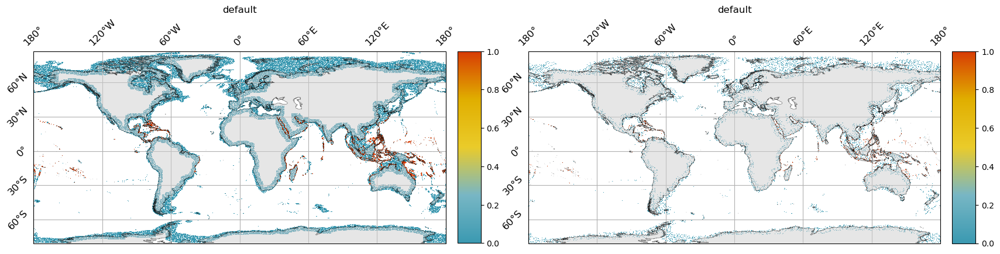

In [158]:
# visualise train and test sets
train_ds = spatial_data.spatially_reform_data(train[1], resolution=config_class.resolution)
test_ds = spatial_data.spatially_reform_data(test[1], resolution=config_class.resolution)

fig, axes = plt.subplots(1, 2, figsize=(20, 10), subplot_kw={"projection": ccrs.PlateCarree()})
graphpy_spatial.plot_spatial(train_ds["UNEP_GDCR"], fax=(fig, axes[0]))
graphpy_spatial.plot_spatial(test_ds["UNEP_GDCR"], fax=(fig, axes[1]))

## Train model

In [ ]:
USE_PREVIOUS = True
NUM_ROUNDS = 1000
params = {
    "objective": "multi:softmax",
    "num_class": 3,
    "max_depth": 3,
}
config_class.resolutio = 0.25
random_state = 0
# predictions = []


if USE_PREVIOUS:
    pixelwise_combined_preds = pd.read_parquet("/maps/rt582/coralshift/runs/bes_tmp/pixelwise_all_global_0-25.parquet_59")
else:
    pixelwise_combined_preds = pd.Series()
covered_indices = set(pixelwise_combined_preds.index) if not pixelwise_combined_preds.empty else set()  # Keep track of indices that have already been predicted

predictions_count = len(covered_indices)
# get total number of samples
(trains, tests, _), _ = ml_processing.ProcessMLData(config_info=config_class).generate_ml_ready_data(ds=all_data)
total_num_samples = len(trains[1]) + len(tests[1])
while predictions_count < total_num_samples:  # Adjust this to your termination condition
    # Update random seed and split data
    config_class.random_state = random_state
    (trains, tests, vals), ds_info = ml_processing.ProcessMLData(config_info=config_class).generate_ml_ready_data(ds=all_data)
    
    # Get the test indices for this split
    test_indices = set(tests[1].index)

    # Check if there are new indices to predict
    new_indices = test_indices - covered_indices
    if not new_indices:
        print(f"Skipping random_state={random_state}, no new test indices.")
        random_state += 1
        continue  # Skip this iteration if no new test indices

    # Update the set of covered indices
    covered_indices.update(new_indices)
    
    dtrain = xgb.DMatrix(trains[0], trains[1])
    dtest = xgb.DMatrix(tests[0], tests[1])
    evals = [(dtrain, "train"), (dtest, "validation")]
    total_num_samples = len(trains[1]) + len(tests[1])

    # Train the model
    model = xgb.train(
        params=params,
        dtrain=dtrain,
        evals=evals,
        verbose_eval=100,
        early_stopping_rounds=50,
        num_boost_round=NUM_ROUNDS
    )
    
    # Generate predictions
    preds = pd.Series(model.predict(dtest), index=tests[1].index, name="predictions")
    
    # predictions.append(preds)
    pixelwise_combined_preds = pd.concat([pixelwise_combined_preds, preds], axis=1).mean(axis=1)
    print(f"Ratio complete: {len(pixelwise_combined_preds)}/{total_num_samples} ({len(pixelwise_combined_preds)/total_num_samples:.6f})")
    random_state += 1


[0]	train-mlogloss:0.74283	validation-mlogloss:0.74263
[100]	train-mlogloss:0.05914	validation-mlogloss:0.06514
[200]	train-mlogloss:0.04842	validation-mlogloss:0.05782
[300]	train-mlogloss:0.04131	validation-mlogloss:0.05300
[400]	train-mlogloss:0.03632	validation-mlogloss:0.05010
[500]	train-mlogloss:0.03263	validation-mlogloss:0.04819
[600]	train-mlogloss:0.02950	validation-mlogloss:0.04665
[700]	train-mlogloss:0.02681	validation-mlogloss:0.04522
[800]	train-mlogloss:0.02447	validation-mlogloss:0.04411
[900]	train-mlogloss:0.02247	validation-mlogloss:0.04349
[999]	train-mlogloss:0.02067	validation-mlogloss:0.04250


TypeError: cannot concatenate object of type '<class 'list'>'; only Series and DataFrame objs are valid

(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'Predictions'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7a32359afe60>)

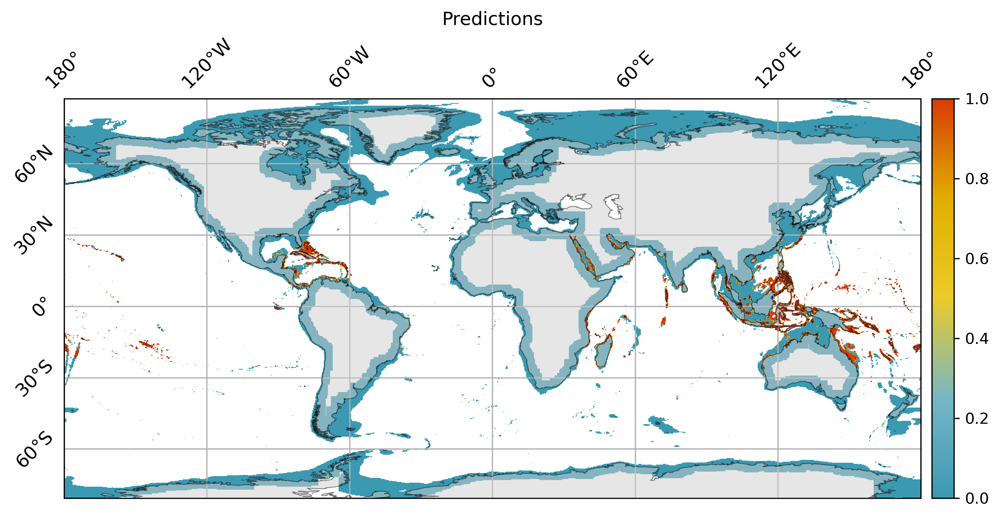

In [33]:
pixelwise_combined_preds = pd.read_parquet("/maps/rt582/coralshift/runs/bes_tmp/pixelwise_all_global_0-25.parquet_59")
pixelwise_combined_preds_ds = spatial_data.spatially_reform_data(pixelwise_combined_preds, resolution=config_class.resolution)
graphpy_spatial.plot_spatial(pixelwise_combined_preds_ds["predictions"], title="Predictions")

File already exists: /maps/rt582/coralshift/runs/bes_tmp/pixelwise_all_global_0-25_59.parquet


(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'Combined predictions'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7a31aab1f350>)

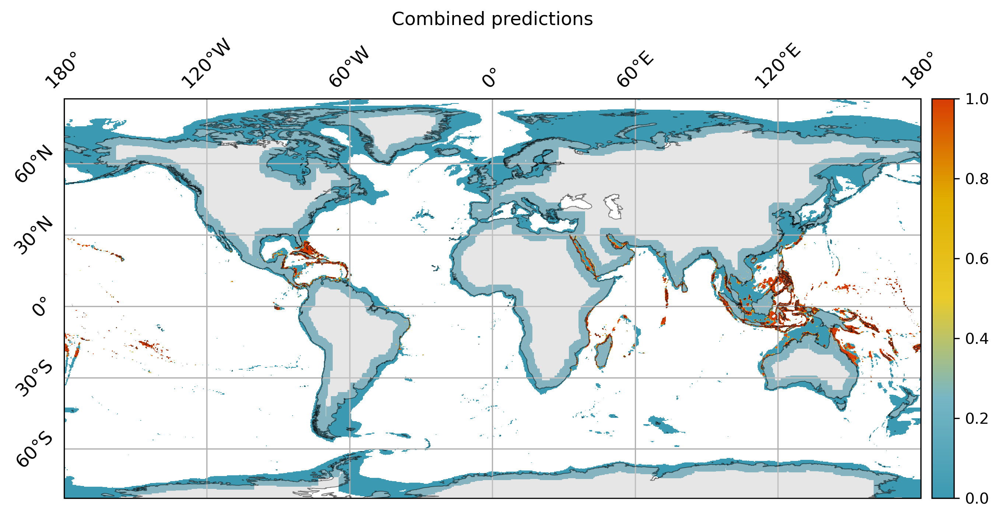

In [48]:
random_state = 59
# save combined predictions
pixelwise_combined_preds_fp = Path("/maps/rt582/coralshift/runs/bes_tmp") / f"pixelwise_all_global_0-25_{random_state}.parquet"

if not pixelwise_combined_preds_fp.exists():
    # pixelwise_combined_preds.to_frame(name="predictions").to_parquet(pixelwise_combined_preds_fp)
    pixelwise_combined_preds.to_parquet(pixelwise_combined_preds_fp)
else:
    print(f"File already exists: {pixelwise_combined_preds_fp}")
gt_series = pd.concat([trains[1], tests[1]], axis=0)
gt_ds = spatial_data.spatially_reform_data(gt_series, resolution=config_class.resolution)

combined_predictions_ds = spatial_data.spatially_reform_data(pixelwise_combined_preds, resolution=config_class.resolution)
# plot combined predictions
graphpy_spatial.plot_spatial(combined_predictions_ds.predictions, title="Combined predictions")

(<Figure size 2000x1000 with 4 Axes>,
 <GeoAxes: title={'center': 'GBR predictions'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7a3190003b00>)

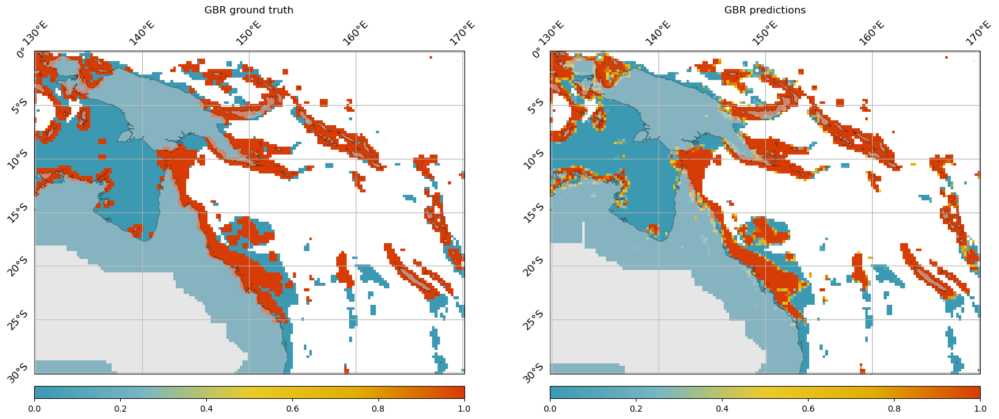

In [56]:
fig, axes = plt.subplots(1,2, figsize=(20, 10), subplot_kw={"projection": ccrs.PlateCarree()})
graphpy_spatial.plot_spatial(gt_ds.UNEP_GDCR.sel(latitude=slice(*cs_lats), longitude=slice(*cs_lons)), title="GBR ground truth", fax=(fig, axes[0]), cbar_dict={"orientation": "horizontal"})
graphpy_spatial.plot_spatial(combined_predictions_ds.predictions.sel(latitude=slice(*cs_lats), longitude=slice(*cs_lons)), title="GBR predictions", fax=(fig, axes[1]), cbar_dict={"orientation": "horizontal"})

In [ ]:
# plot a scatter of confusion matrix of predictions and ground truth

# TODO: don't know why this isn't working

# confusion matrix using scikitlearn
from sklearn.metrics import confusion_matrix

conf_values = confusion_matrix(gt_ds["UNEP_GDCR"].values.flatten(), combined_predictions_ds["predictions"].values.flatten())
# plot values
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.heatmap(conf_values, annot=True, ax=ax, cmap=graphpy_colours.ColourMapGenerator().get_cmap("climate_stripes"), fmt='d')
# label axes
ax.set_xlabel("Ground Truth")
ax.set_ylabel("Predicted")



ValueError: Found input variables with inconsistent numbers of samples: [969120, 967680]

# Load future data


In [22]:
# # load datasets
ssp_num = 585
ssp = f"ssp{ssp_num}"
AWI_resmip_dir = Path("/maps/rt582/cmipper/.esgpull/data/CMIP6/ScenarioMIP/AWI/AWI-CM-1-1-MR") / ssp / "r1i1p1f1/Omon"
CSIRO_resmip_dir = Path("/maps/rt582/cmipper/.esgpull/data/CMIP6/ScenarioMIP/CSIRO/ACCESS-ESM1-5") / ssp / "r1i1p1f1/Omon"

rsdo_resmip = spatial_data.process_xa_d(xa.open_mfdataset((AWI_resmip_dir / "rsdo").rglob("remapped/*.nc")))
so_resmip = spatial_data.process_xa_d(xa.open_mfdataset((AWI_resmip_dir / "so").rglob("remapped/*.nc"))).isel(depth=0).drop_vars(["depth"])
tos_resmip = spatial_data.process_xa_d(xa.open_mfdataset((AWI_resmip_dir / "tos").rglob("remapped/*.nc")))

# # calculate par
# par_resmip = thresholding.calc_par(unep_bathymetry.elevation.where(unep_bathymetry.elevation >= -100, np.nan), rsdo_resmip.rsdo, kd490)
# par_resmip.attrs["variable_id"] = "par"
# par_resmip = par_resmip.where(np.isfinite(par_resmip), np.nan)
# par_masked = par_resmip.par.where((par_resmip.par >= 45.84436) & (par_resmip.par <= 339.26157))
# par_masked = par_masked.to_dataset(name="par")
# par_masked.attrs["variable_id"] = "par"

# TODO: sort out this time data
arag_resmip = spatial_data.process_xa_d(xa.open_mfdataset((CSIRO_resmip_dir / "arag").rglob("remapped/*.nc"), use_cftime=True)).isel(depth=0).drop_vars(["depth"])
no3_resmip = spatial_data.process_xa_d(xa.open_mfdataset((CSIRO_resmip_dir / "no3").rglob("remapped/*.nc"), use_cftime=True)).isel(depth=0).drop_vars(["depth"])
po4_resmip = spatial_data.process_xa_d(xa.open_mfdataset((CSIRO_resmip_dir / "po4").rglob("*.nc"), use_cftime=True)).isel(depth=0).drop_vars(["depth"])

# process cftime time values
for dataset in [arag_resmip, no3_resmip, po4_resmip]:
    dataset["time"] = [datetime(t.year, t.month, t.day) for t in dataset.time.values]

# remove any dates past 2100 (necessary since very large dates not represented accurately in np.datetime64)
datasets = [
    # par_masked,
    rsdo_resmip,
    tos_resmip, so_resmip, 
            arag_resmip.sel(time=slice(None, datetime(2100, 2, 1))), no3_resmip.sel(time=slice(None, datetime(2100, 2, 1))), po4_resmip.sel(time=slice(None, datetime(2100, 2, 1)))
            ]
future_datasets = [thresholding.standardize_time(ds) for ds in datasets]

resmip_da = xa.merge(future_datasets);
resmip_da = resmip_da.drop_vars(["lev_bnds"])
resmip_da

/maps/rt582/miniforge3/envs/shiftpy/lib/python3.12/site-packages/xarray/core/indexing.py:1593: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]


<xarray.Dataset> Size: 26GB
Dimensions:    (time: 1032, longitude: 1440, latitude: 720)
Coordinates:
  * time       (time) datetime64[ns] 8kB 2015-01-01 2015-02-01 ... 2100-12-01
  * longitude  (longitude) float64 12kB -180.0 -179.8 -179.5 ... 179.5 179.8
  * latitude   (latitude) float64 6kB -90.0 -89.75 -89.5 ... 89.25 89.5 89.75
Data variables:
    rsdo       (time, latitude, longitude) float32 4GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    tos        (time, latitude, longitude) float32 4GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    so         (time, latitude, longitude) float32 4GB dask.array<chunksize=(1, 182, 1440), meta=np.ndarray>
    arag       (time, latitude, longitude) float32 4GB dask.array<chunksize=(361, 182, 1440), meta=np.ndarray>
    no3        (time, latitude, longitude) float32 4GB dask.array<chunksize=(721, 182, 1440), meta=np.ndarray>
    po4        (time, latitude, longitude) float32 4GB dask.array<chunksize=(1, 182, 1440), meta=np.ndarray>
Attributes: (12/43)
    CDI:                       Climate Data Interface version 2.4.0 (https://...
    Conventions:               CF-1.7 CMIP-6.2
    source:                    AWI-CM-1-1-MR
    institution:               Alfred Wegener Institute, Helmholtz Centre for...
    activity_id:               ScenarioMIP
    creation_date:             2018-12-18T12:00:00Z
    ...                        ...
    parent_source_id:          AWI-CM-1-1-MR
    parent_time_units:         days since 1850-1-1
    parent_variant_label:      r1i1p1f1
    history:                   Sun Nov 24 11:39:38 2024: cdo -P 128 remapcon,...
    CDO:                       Climate Data Operators version 2.4.0 (https://...
    cdo_openmp_thread_number:  128

In [60]:
# compute stats
resmip_stats = ml_processing.calculate_statistics(resmip_da, vars=resmip_da.data_vars, years_window=[2015, 2100])

calculating statistics for variables: 100%|██████████| 6/6 [20:05<00:00, 200.85s/it]


In [63]:
# buffer and save future stats
resmip_stats_fp = Path("/maps/rt582/coralshift/runs/bes_tmp") / f"resmip_stats_{ssp_num}.nc"
if not resmip_stats_fp.exists():
    resmip_stats_buffered = get_data.apply_fill_loess(resmip_stats, nx=buffer_size, ny=buffer_size, max_workers=64)
    resmip_stats_buffered.to_netcdf(resmip_stats_fp)
else:
    print(f"Loading file from {resmip_stats_fp}")
    resmip_stats_buffered = xa.open_dataset(resmip_stats_fp)

# combine environmental with bathymetry and label
resmip_all_data = xa.merge([resmip_stats_buffered, unep_bathymetry])
resmip_all_features = resmip_all_data.drop_vars(["UNEP_GDCR"])
gt_ds = spatial_data.spatially_reform_data(resmip_all_data["UNEP_GDCR"], resolution=config_class.resolution)

240 variable(s) to spatially buffer...


NameError: name 'ThreadPoolExecutor' is not defined

In [ ]:
# run inference with trained model

# load best-performing model
model_fp = Path("/maps/rt582/coralshift/runs/bes_tmp") / "pixelwise_cla.model"

model = xgb.Booster()
model.load_model(model_fp)

dall = xgb.DMatrix(resmip_all_features)

future_inference = pd.Series(model.predict(dall), index=resmip_all_features.index, name="predictions")

# Visualisation

### Climate stripes

In [3]:
all_historical = all_historical.compute()

In [5]:
all_resmip = resmip_da.compute()

In [6]:
# concatenate historical and resmip data
alltime_data = xa.concat([all_historical, all_resmip], dim="time")

In [7]:
# mask for reef presence
reef_mask = unep_bathymetry.UNEP_GDCR.where(unep_bathymetry.UNEP_GDCR == 1, np.nan)
alltime_data_reef = alltime_data.where(reef_mask == 1)

In [30]:
# variable
var = "arag"
all_time_var = alltime_data_reef[var].compute()
 
vals = np.zeros(len(np.linspace(1850, 2100, 100)))
years = []
window = 50
for i, t in tqdm(enumerate(np.linspace(1850, 2100, 100)), total=len(vals)):
    start_year = np.datetime64(str(int(t-window/2)))
    end_year = np.datetime64(str(int(t+window/2)))
    years.append((start_year, end_year))
    vals[i] = np.nanmedian(all_time_var.sel(time=slice(start_year, end_year)).mean(
        dim=["time"]).values)
# find year values spanning duration closest to mean
all_time_mean = np.nanmedian(vals)

centre_years = years[np.argmin(np.abs(vals - all_time_mean))]
start_year = centre_years[0]
end_year = centre_years[1]

 16%|█▌        | 16/100 [00:33<03:03,  2.19s/it]

100%|██████████| 100/100 [03:09<00:00,  1.90s/it]


In [60]:
var = "arag"
all_time_var = alltime_data_reef[var].compute()
ds = all_time_var
# start_year = 1966
# end_year = start_year+window

annual_avg = ds.groupby("time.year").mean(dim=["latitude", "longitude"]).resample(time="YE").mean().compute()

In [58]:
noise

array([-0.13531185,  0.05210706,  0.00237151,  0.04610443, -0.01602094,
       -0.01521007,  0.096491  , -0.03550299, -0.07475076, -0.09235143,
        0.0322519 , -0.04207647,  0.05122059, -0.1250158 ,  0.04213282,
        0.10432543, -0.05691861,  0.07798456, -0.02058737, -0.17650029,
        0.04405901, -0.10236939,  0.19056308,  0.02522158,  0.13579136,
        0.10079836,  0.02883647, -0.19281281, -0.12809761, -0.17152651,
        0.0275829 ,  0.07039287, -0.0055701 ,  0.01769887,  0.00692528,
        0.05508127, -0.02835526, -0.03799281,  0.01095821, -0.21993478])

In [62]:
annual_avg.interpolate_na("time")

<xarray.DataArray 'arag' (time: 251)> Size: 1kB
array([6.1542909e-05, 6.2527390e-05, 6.4735439e-05, 6.6614135e-05,
       6.3148480e-05, 6.4649103e-05, 6.4219930e-05, 6.5748922e-05,
       6.6141729e-05, 6.7753215e-05, 6.4596425e-05, 6.3838517e-05,
       6.2508807e-05, 6.1483093e-05, 6.0113580e-05, 6.0637398e-05,
       6.3964319e-05, 6.5405002e-05, 6.2195264e-05, 6.3664243e-05,
       6.4808570e-05, 6.8906389e-05, 6.6127337e-05, 6.2354586e-05,
       6.0744260e-05, 6.0746315e-05, 6.1935083e-05, 6.1679631e-05,
       6.2686966e-05, 6.2764833e-05, 6.3497944e-05, 6.3174404e-05,
       6.2444400e-05, 5.9515776e-05, 5.9096463e-05, 6.3840380e-05,
       6.4392530e-05, 6.0255148e-05, 6.0432390e-05, 6.1223276e-05,
       5.9986658e-05, 5.9982543e-05, 6.1872481e-05, 6.2445557e-05,
       6.1986888e-05, 6.3006075e-05, 6.2359461e-05, 6.2554442e-05,
       6.5596636e-05, 6.3784195e-05, 6.1084844e-05, 6.0454753e-05,
       6.0723429e-05, 6.3815554e-05, 6.2942891e-05, 6.2752581e-05,
       6.1252671e-05, 5.9667771e-05, 6.2112005e-05, 5.9778195e-05,
       6.1386490e-05, 6.0763337e-05, 6.1200837e-05, 6.0150294e-05,
       6.0033697e-05, 6.0093877e-05, 5.7495898e-05, 5.7779991e-05,
       6.0787468e-05, 6.4483822e-05, 6.6834611e-05, 6.4701817e-05,
       6.4430576e-05, 6.3263906e-05, 6.1223349e-05, 5.9722573e-05,
       5.9397411e-05, 5.8520356e-05, 6.0494265e-05, 6.3759653e-05,
...
       5.8491758e-05, 5.8665177e-05, 5.8839072e-05, 5.9012491e-05,
       5.9185906e-05, 5.9359325e-05, 5.9533220e-05, 5.9706639e-05,
       5.9880058e-05, 6.0053477e-05, 6.0227372e-05, 6.0400791e-05,
       6.0574206e-05, 6.0747625e-05, 6.0921520e-05, 6.1094943e-05,
       6.1268358e-05, 6.1441773e-05, 6.1615669e-05, 6.1789091e-05,
       6.1962506e-05, 6.2135929e-05, 6.2309824e-05, 6.2483239e-05,
       6.2244624e-05, 6.0921968e-05, 6.0362527e-05, 5.8635702e-05,
       5.7998466e-05, 5.7638146e-05, 5.5636137e-05, 5.6964545e-05,
       5.8735634e-05, 5.8325462e-05, 5.6818692e-05, 5.5196098e-05,
       5.9060985e-05, 6.2199790e-05, 6.1856990e-05, 5.9294780e-05,
       5.8308346e-05, 5.9912181e-05, 5.8454974e-05, 5.8881331e-05,
       5.9307684e-05, 5.9734040e-05, 6.0161565e-05, 6.0587921e-05,
       6.1014274e-05, 6.1440631e-05, 6.1868152e-05, 6.2294508e-05,
       6.2720865e-05, 6.3147221e-05, 6.4413733e-05, 6.6282424e-05,
       6.7762288e-05, 6.6992739e-05, 6.3752355e-05, 6.3684354e-05,
       6.2412881e-05, 6.4860411e-05, 6.6868131e-05, 6.7927132e-05,
       6.7741137e-05, 6.8126094e-05, 6.5380802e-05, 6.4221960e-05,
       6.6500441e-05, 6.8057030e-05, 6.7726483e-05, 6.5151311e-05,
       6.4180880e-05, 6.5874956e-05, 6.5287102e-05, 6.7577115e-05,
       6.8721325e-05, 6.8973975e-05, 5.6681598e-05], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2kB 1850-12-31 1851-12-31 ... 2100-12-31
Attributes:
    standard_name:   mole_concentration_of_aragonite_expressed_as_carbon_in_s...
    long_name:       Aragonite Concentration
    units:           mol m-3
    comment:         Sum of particulate aragonite components (e.g. Phytoplank...
    original_units:  mmol m-3
    history:         2019-11-15T16:17:31Z altered by CMOR: Converted units fr...
    cell_methods:    area: mean where sea time: mean
    cell_measures:   area: areacello volume: volcello

In [69]:
noise

array([ 1.11154649e-05,  5.75278126e-06,  3.38991447e-06, -1.12848725e-05,
       -6.03559541e-06,  3.64525411e-06, -6.26370401e-07, -1.09799294e-05,
       -1.87464525e-05, -1.23131293e-05, -4.02667487e-06, -1.14540439e-05,
        2.05489257e-05, -1.30497372e-06,  3.26178271e-06, -4.28709446e-06,
        1.02539877e-05,  8.54685121e-06, -4.23491049e-06, -3.92479598e-06,
       -4.21733422e-07, -2.50644486e-07, -8.76023170e-06, -9.16854714e-06,
        1.21727915e-05, -1.29493938e-05, -2.81127250e-06,  9.43828888e-06,
       -2.24167157e-06, -2.62962463e-05,  5.93764765e-08, -2.19331316e-06,
       -6.55146148e-06,  6.16368072e-06,  4.17099166e-06, -1.07469783e-05,
       -1.13408936e-05,  2.92091015e-06,  2.19687003e-06,  1.81312647e-07])

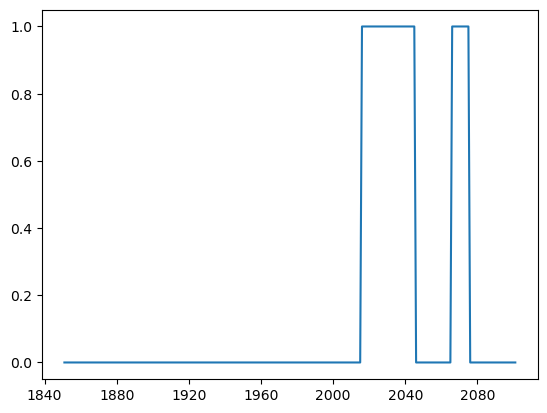

In [70]:
# annual_avg = ds.groupby("time.year").mean(dim=["latitude", "longitude"]).resample(time="YE").mean().compute()
nan_mask = np.isnan(annual_avg)
std = 1e-5
noise = np.random.normal(0, std, nan_mask.sum().values)
noise_array = np.zeros_like(nan_mask)
noise_array[nan_mask] = noise
# fill nans through linear interpolation
annual_avg_interped = annual_avg.interpolate_na("time")+noise_array
# annual_avg = annual_avg_interped.where(~nan_mask, annual_avg_interped+noise)
plt.plot(annual_avg_interped.time, annual_avg_interped)

In [95]:
all_time_var = xa.concat([par_historical, par_resmip], dim="time")
all_time_var = all_time_var.compute()

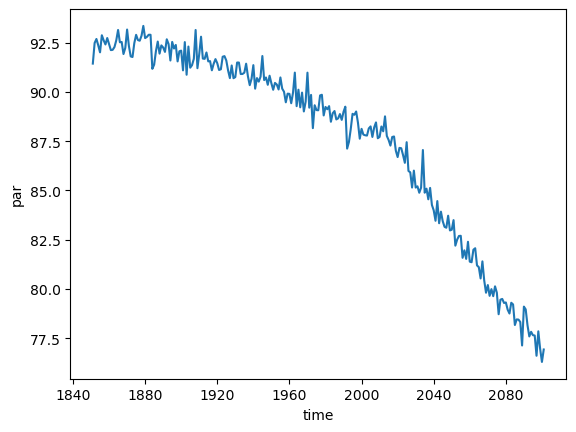

In [96]:

var = "par"
# all_time_var = alltime_data_reef[var].compute()
ds = all_time_var[var]
# start_year = 1966
# end_year = start_year+window

annual_avg = ds.groupby("time.year").mean(dim=["latitude", "longitude"]).resample(time="YE").mean().compute()
annual_avg.plot()

In [97]:
vals = np.zeros(len(np.linspace(1850, 2100, 100)))
years = []
window = 50
for i, t in tqdm(enumerate(np.linspace(1850, 2100, 100)), total=len(vals)):
    start_year = np.datetime64(str(int(t-window/2)))
    end_year = np.datetime64(str(int(t+window/2)))
    years.append((start_year, end_year))
    vals[i] = np.nanmedian(ds.sel(time=slice(start_year, end_year)).mean(
        dim=["time"]).values)
# find year values spanning duration closest to mean
all_time_mean = np.nanmedian(vals)

centre_years = years[np.argmin(np.abs(vals - all_time_mean))]
start_year = centre_years[0]
end_year = centre_years[1]

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [02:26<00:00,  1.46s/it]


In [98]:
start_year = 1950
end_year = 2100
# start_year = 2045
# Step 2: Normalize data relative to a baseline (e.g., 1850-1900 average)
baseline = annual_avg.sel(time=slice(np.datetime64(f'{start_year}'), np.datetime64(f'{end_year}'))).mean()
anomalies = annual_avg - baseline
# anomalies = anomalies.compute()

print(anomalies.min())
print(anomalies.max())

<xarray.DataArray 'par' ()> Size: 4B
array(-8.74955, dtype=float32)
<xarray.DataArray 'par' ()> Size: 4B
array(8.300507, dtype=float32)


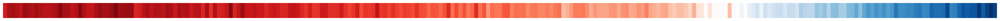

In [99]:
# climate stripes with tos
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable


# start_year = 1979
# end_year = 2029


ds = all_time_var
time = ds.time.values

# find largest of minimum and maximum anomalies
max_deviation = np.max([np.abs(anomalies.min().values), np.abs(anomalies.max().values)])

# Step 3: Map values to a colormap
stripes_cmap = graphpy_colours.ColourMapGenerator().get_cmap("climate_stripes").reversed()
norm = Normalize(vmin=-max_deviation, vmax=max_deviation)
colors = stripes_cmap(norm(anomalies.values))

# Step 4: Create the climate stripes plot
fig, ax = plt.subplots(figsize=(33.1, 0.8), dpi=300)
ax.imshow([colors], aspect="auto", extent=[np.min(ds.time.values), np.max(ds.time.values), 0, 1])
ax.set_yticks([])  # Remove y-axis
# ax.set_xticks(np.arange(start_year, end_year, 20))  # Set appropriate x-axis ticks
# ax.set_title("Global Sea Surface Temperature Anomalies (Climate Stripes)")
# ax.set_xlabel("Year")

# Add a colorbar for reference
# sm = ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array(anomalies.values)
# cbar = fig.colorbar(sm, orientation="horizontal", ax=ax, pad=0.2)
# cbar.set_label("Temperature Anomaly (°C)")
# turn off everything but colours
[ax.spines[pos].set_visible(False) for pos in ["top", "right", "left", "bottom"]]
ax.set_xticks([])
ax.set_xticklabels([])
ax.patch.set_visible(False)
fig.patch.set_visible(False)

plt.tight_layout()
plt.show()

In [110]:
lim_unep = unep_bathymetry["UNEP_GDCR"].sel(latitude=slice(*cs_lats), longitude=slice(*cs_lons))

(<Figure size 6000x6000 with 1 Axes>,
 <GeoAxes: xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7df619be7620>)

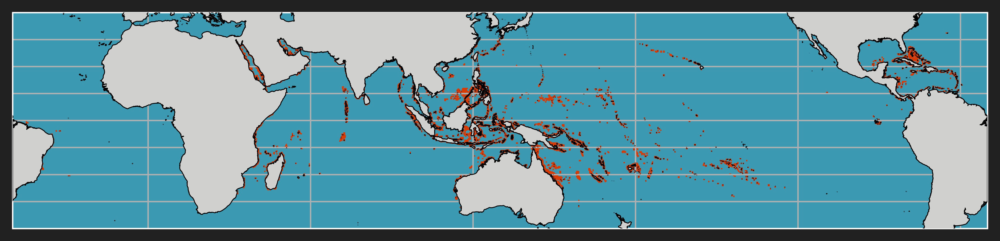

In [140]:
# plot world of coral today
graphpy_spatial.plot_spatial(
    # lim_unep,
    unep_bathymetry["UNEP_GDCR"],
                            #  map_proj=ccrs.Robinson(central_longitude=130),
                             map_proj=ccrs.PlateCarree(central_longitude=130),
                             presentation_format=True,
                             labels=[],
                             dpi=600,
                             extent=[-180, 180, -40, 40],
                             cbar_dict={"cbar": False},
                             title="",
                             cartopy_dict={"alpha": 1, "facecolor": "#d0d0cf"}
                             )

## Time series

(<Figure size 1500x600 with 1 Axes>, <Axes: >)

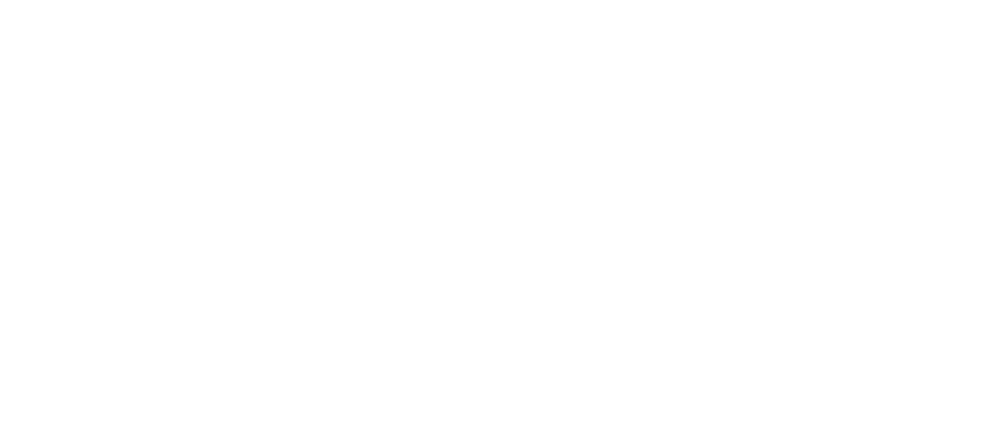

In [44]:
vals = rsdo_historical.isel(time=slice(0,120)).mean(dim=["latitude", "longitude"])

fig, ax = plt.subplots(1,1, figsize=(5,2), dpi=300)
ax.plot(vals.time.values, vals.rsdo.values, color="#FFFFFF", lw=2)
# plot std deviation as fill_between
ax.patch.set_alpha(0)
fig.patch.set_alpha(0)

# remove everything but the plotted curve
plt.axis('off')
graphpy_colours.customize_plot_colors(fig, ax)


(<Figure size 1500x600 with 1 Axes>, <Axes: ylabel='Density'>)

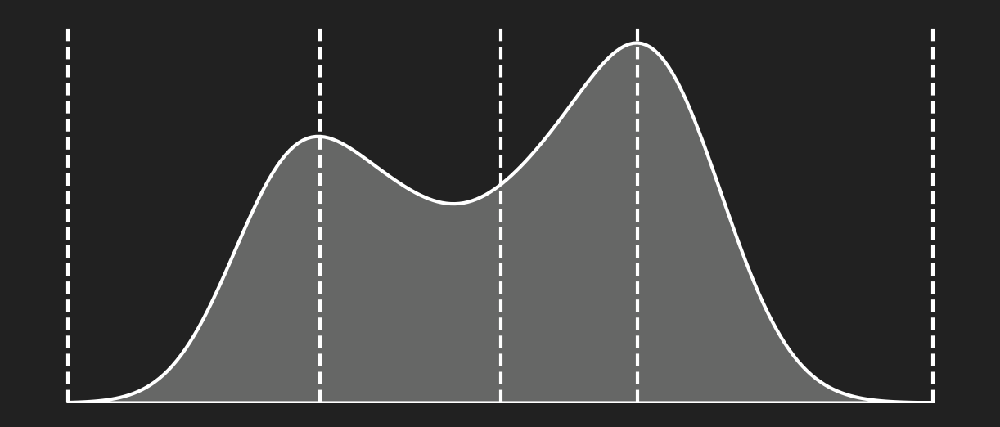

In [ ]:
from scipy.signal import find_peaks

# plot kde
lim_da = tos_historical["tos"].sel(latitude=slice(*cs_lats), longitude=slice(*cs_lons)).isel(time=slice(0,120))
fig, ax = plt.subplots(1,1, figsize=(5,2), dpi=300)
sns.kdeplot(lim_da.mean(dim=["latitude", "longitude"]).values.flatten(), ax=ax, ec="#FFFFFF", color="#d0d1cf", lw=1, fill=True, alpha=0.4)
plt.axis('off')

kde = sns.kdeplot(lim_da.mean(dim=["latitude", "longitude"]).values.flatten())
x, y = kde.get_lines()[0].get_data()
plt.close()  # This will close the plot
# Find peaks (maxima) in the KDE
peaks, _ = find_peaks(y)
maxima_x = x[peaks]  # x positions of maxima

# Find the minimum and maximum x-values
min_x, max_x = np.min(x), np.max(x)

# Calculate the mean of the original data
mean_value = np.mean(lim_da.mean(dim=["latitude", "longitude"]).values.flatten())

# plot as vertical lines
for x_val in [min_x, max_x, mean_value, *maxima_x]:
    ax.axvline(x_val, color="white", linestyle="--", lw=1)

graphpy_colours.customize_plot_colors(fig, ax)


## Downsampling

In [74]:
# load high-res bathymetry
hr_bath = get_data.ReturnRaster(config_info=config_class).get_raw_raster("bathymetry").sel(latitude=slice(*cs_lats), longitude=slice(*cs_lons))


Loading gebco elevation xarray across [-31, -1] latitudes & [139, 167] longitudes from /maps-priv/maps/rt582/coralshift/data/bathymetry/gebco/GEBCO_2023_n90-0_s90-0_w180-0_e180-0.nc.


In [ ]:
lr_bath = get_data.ReturnRaster(config_info=config_class).get_raw_raster("bathymetry").sel(latitude=slice(*cs_lats), longitude=slice(*cs_lons))


(<Figure size 6000x6000 with 1 Axes>,
 <GeoAxes: xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7bb01f5ecce0>)

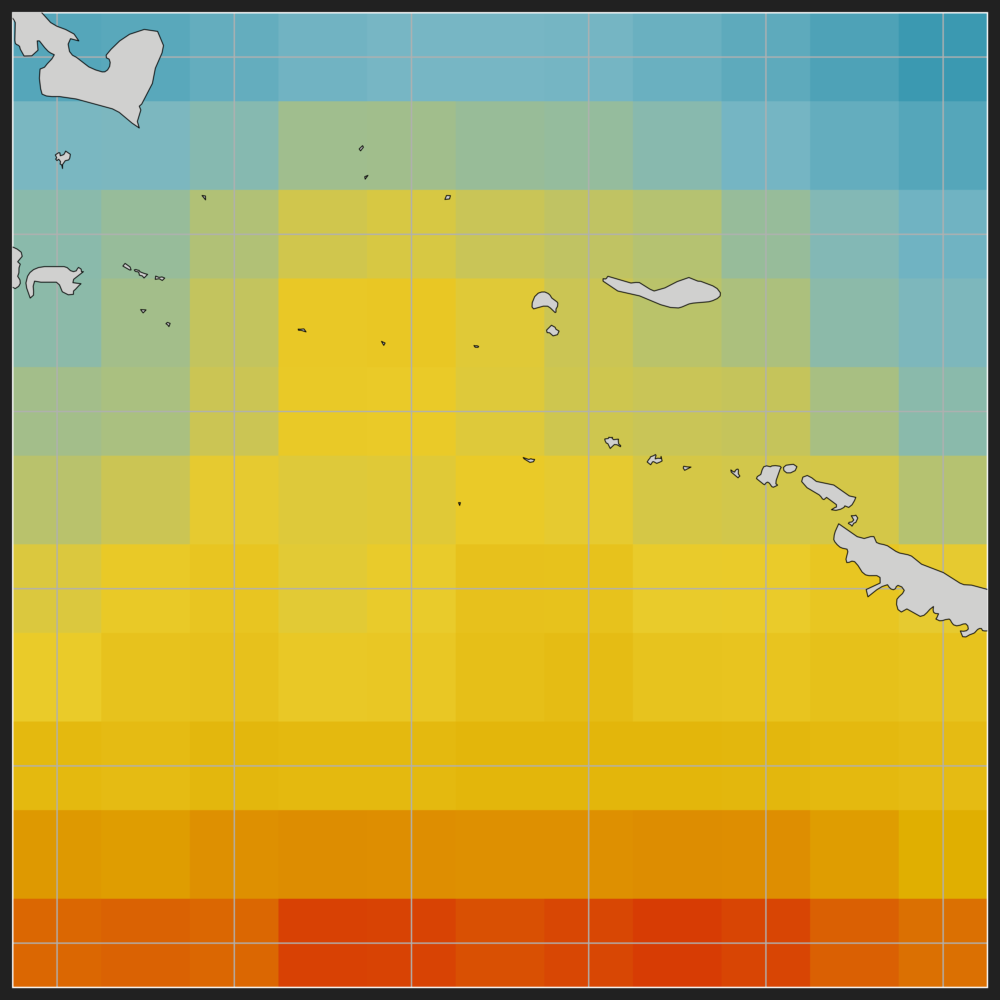

In [98]:
graphpy_spatial.plot_spatial(
    # hr_bath.elevation,
    rsdo_historical.rsdo.isel(time=0).sel(latitude=slice(*wider_lats), longitude=slice(*wider_lons)),
    map_proj=ccrs.PlateCarree(), presentation_format=True,
    labels=[],
    dpi=600, 
    cbar_dict={"cbar": False}, 
    title="", cartopy_dict={"alpha": 1, "facecolor": "#d0d0cf"},
                            #  val_lims=[-100, 0]
                             )

(<Figure size 6000x6000 with 1 Axes>,
 <GeoAxes: xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7bb01c217bc0>)

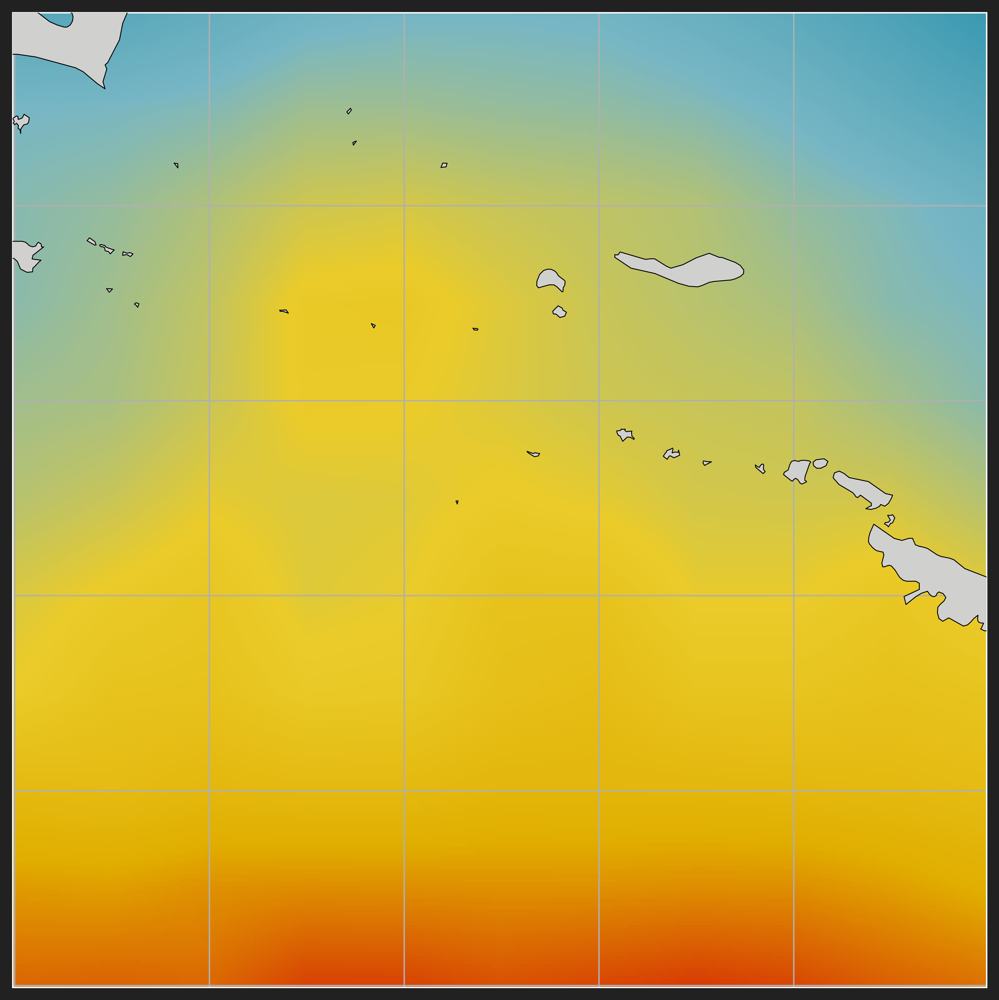

In [99]:
wider_lats = [-12.5,-10]
wider_lons = [151, 153.5]
# resample to 0.01 degrees
hr_rsdo = rsdo_historical.rsdo.isel(time=0).sel(latitude=slice(*wider_lats), longitude=slice(*wider_lons)).interp(latitude=np.arange(*wider_lats, 0.01), longitude=np.arange(*wider_lons, 0.01))
graphpy_spatial.plot_spatial(hr_rsdo.sel(latitude=slice(*wider_lats), longitude=slice(*wider_lons)),
    map_proj=ccrs.PlateCarree(), presentation_format=True,
    labels=[],
    dpi=600, 
    cbar_dict={"cbar": False}, 
    title="", cartopy_dict={"alpha": 1, "facecolor": "#d0d0cf"},                             )

(<Figure size 6000x6000 with 2 Axes>,
 <GeoAxes: xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7bb01f5ec9b0>)

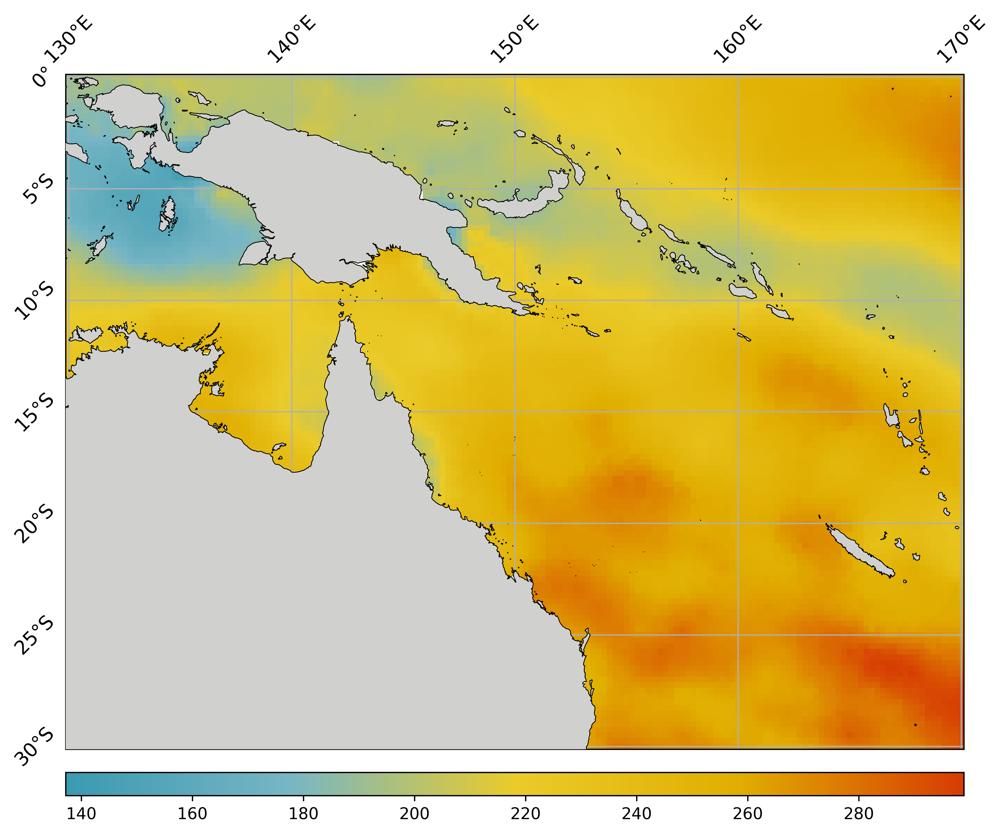

In [92]:
graphpy_spatial.plot_spatial(
    # hr_bath.elevation,
    rsdo_historical.rsdo.isel(time=0).sel(latitude=slice(*cs_lats), longitude=slice(*cs_lons)),
    map_proj=ccrs.PlateCarree(), presentation_format=False, 
    # labels=[],
    dpi=600, 
    cbar_dict={"cbar": True}, 
    title="", cartopy_dict={"alpha": 1, "facecolor": "#d0d0cf"},
                            #  val_lims=[-100, 0]
                             )

(<Figure size 6000x6000 with 2 Axes>,
 <GeoAxes: xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7bb035736720>)

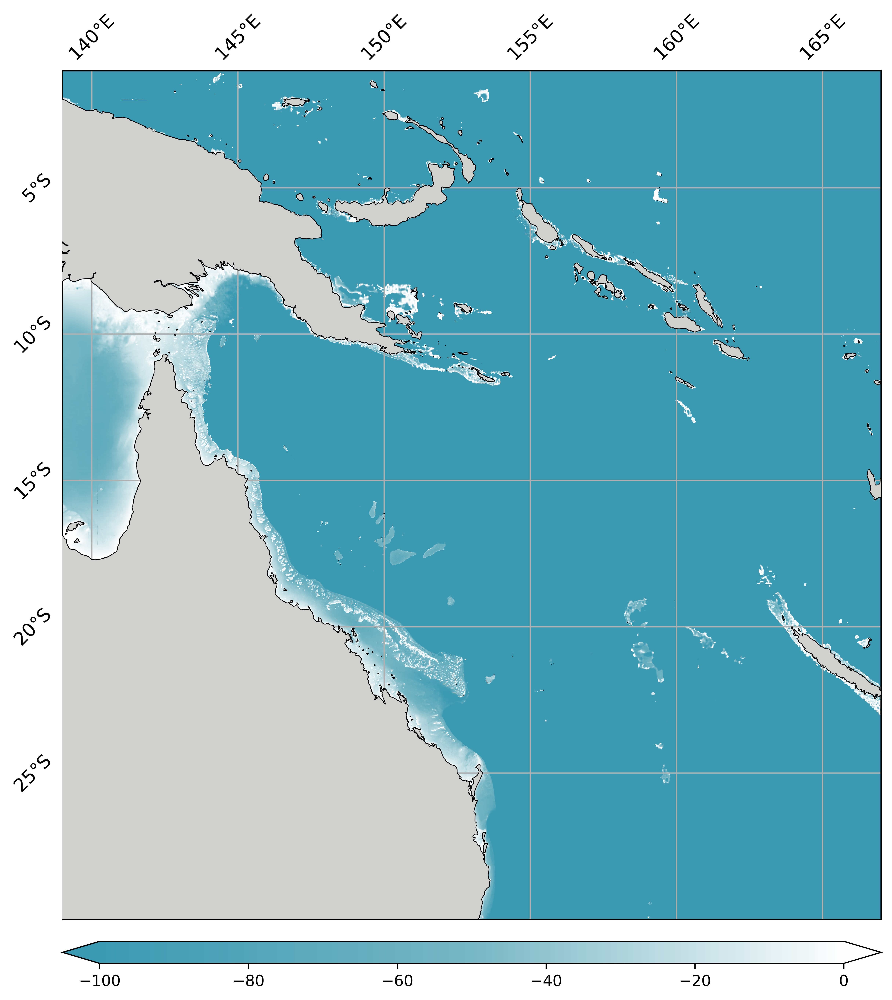

In [75]:
graphpy_spatial.plot_spatial(
    hr_bath.elevation,
    # hr_bath.elevation.sel(latitude=slice(-13,-11.5), longitude=slice(142.5, 144)),
    map_proj=ccrs.PlateCarree(), presentation_format=False, 
    # labels=[],
    dpi=600, cbar_dict={"cbar": True, "cmap_type": "lim_blue"}, title="", cartopy_dict={"alpha": 1, "facecolor": "#d0d0cf"},
                             val_lims=[-100, 0])

# DEPRECATED

In [ ]:
# calculate stats
import xarray as xa
import numpy as np
from scipy.stats import skew, kurtosis

def compute_timeseries_metrics(dataset: xa.Dataset):
    """
    Compute key metrics for a timeseries dataset, including derived seasonal statistics.

    Args:
        dataset (xarray.Dataset): Input dataset with a 'time' dimension and raw monthly values.

    Returns:
        xarray.Dataset: Dataset with computed metrics as new variables.
    """
    if "time" not in dataset.dims:
        raise ValueError("The dataset must have a 'time' dimension.")

    # Define seasons based on month
    seasons = {
        "DJF": [12, 1, 2],  # Winter
        # "MAM": [3, 4, 5],   # Spring
        "JJA": [6, 7, 8],   # Summer
        # "SON": [9, 10, 11], # Fall
    }

    # Assign seasons as a new coordinate
    def get_season(month):
        for season, months in seasons.items():
            if month in months:
                return season
        return None

    dataset = dataset.assign_coords(
        season=("time", [get_season(m) for m in dataset["time"].dt.month])
    )

    # Prepare an output dataset for metrics
    metrics_ds = xa.Dataset()

    # All-time metrics
    for var_name, var_data in dataset.data_vars.items():
        if np.issubdtype(var_data.dtype, np.number):  # Process only numeric variables
            metrics_ds[f"{var_name}_all_time_min"] = var_data.min(dim="time")
            metrics_ds[f"{var_name}_all_time_max"] = var_data.max(dim="time")
            metrics_ds[f"{var_name}_all_time_iqr"] = var_data.quantile([0.25, 0.75], interpolation="linear").compute()
            metrics_ds[f"{var_name}_all_time_skewness"] = xa.apply_ufunc(skew, var_data, input_core_dims=[["time"]], vectorize=True)
            metrics_ds[f"{var_name}_all_time_kurtosis"] = xa.apply_ufunc(kurtosis, var_data, input_core_dims=[["time"]], vectorize=True)

    # Seasonal metrics
    for var_name, var_data in dataset.data_vars.items():
        if np.issubdtype(var_data.dtype, np.number):  # Process only numeric variables
            seasonal_group = var_data.groupby("season")
            metrics_ds[f"{var_name}_seasonal_min"] = seasonal_group.min(dim="time")
            metrics_ds[f"{var_name}_seasonal_max"] = seasonal_group.max(dim="time")
            metrics_ds[f"{var_name}_seasonal_iqr"] = seasonal_group.quantile(0.75, dim="time") - seasonal_group.quantile(0.25, dim="time")
            metrics_ds[f"{var_name}_seasonal_skewness"] = seasonal_group.reduce(
                lambda x: xa.apply_ufunc(skew, x, input_core_dims=[["time"]], vectorize=True)
            )
            metrics_ds[f"{var_name}_seasonal_kurtosis"] = seasonal_group.reduce(
                lambda x: xa.apply_ufunc(kurtosis, x, input_core_dims=[["time"]], vectorize=True)
            )
    
    return metrics_ds

# Define seasons based on month
seasons = {
    "DJF": [12, 1, 2],  # Winter
    # "MAM": [3, 4, 5],   # Spring
    "JJA": [6, 7, 8],   # Summer
    # "SON": [9, 10, 11], # Fall
}

metrics_ds = xa.Dataset()

q25 = all_historical_rechunked.quantile(0.25, dim="time", method="linear").rsdo
q75 = all_historical_rechunked.quantile(0.75, dim="time", method="linear").rsdo
metrics_ds[f"{var_name}_all_time_iqr"] = q75 - q25
metrics_ds.compute()
    
def get_season(month):
    for season, months in seasons.items():
        if month in months:
            return season
    return None

dataset = all_historical_buffered.isel(time=slice(0,1))
dataset.assign_coords(season=("time", [get_season(m) for m in dataset["time"].dt.month]))
metrics_ds = xa.Dataset()

for var_name, var_data in dataset.data_vars.items():
    if np.issubdtype(var_data.dtype, np.number):  # Process only numeric variables
        metrics_ds[f"{var_name}_all_time_min"] = var_data.min(dim="time")
        metrics_ds[f"{var_name}_all_time_max"] = var_data.max(dim="time")
        q25 = var_data.quantile(0.25, dim="time", method="linear")
        q75 = var_data.quantile(0.75, dim="time", method="linear")
        metrics_ds[f"{var_name}_all_time_iqr"] = q75 - q25
        # metrics_ds[f"{var_name}_all_time_iqr"] = var_data.quantile([0.25, 0.75], method="linear").compute()
        # metrics_ds[f"{var_name}_all_time_skewness"] = xa.apply_ufunc(skew, var_data, input_core_dims=[["time"]], vectorize=True)
        # metrics_ds[f"{var_name}_all_time_kurtosis"] = xa.apply_ufunc(kurtosis, var_data, input_core_dims=[["time"]], vectorize=True)

metrics_ds

<xarray.Dataset> Size: 75MB
Dimensions:                (longitude: 1440, latitude: 720, bnds: 2)
Coordinates:
  * longitude              (longitude) float64 12kB -180.0 -179.8 ... 179.8
  * latitude               (latitude) float64 6kB -90.0 -89.75 ... 89.5 89.75
Dimensions without coordinates: bnds
Data variables: (12/21)
    rsdo_all_time_min      (latitude, longitude) float32 4MB nan nan ... 0.0 0.0
    rsdo_all_time_max      (latitude, longitude) float32 4MB nan nan ... 0.0 0.0
    rsdo_all_time_iqr      (latitude, longitude) float32 4MB nan nan ... 0.0 0.0
    tos_all_time_min       (latitude, longitude) float32 4MB nan nan ... -1.717
    tos_all_time_max       (latitude, longitude) float32 4MB nan nan ... -1.717
    tos_all_time_iqr       (latitude, longitude) float32 4MB nan nan ... 0.0 0.0
    ...                     ...
    no3_all_time_min       (latitude, longitude) float32 4MB nan nan ... 0.01594
    no3_all_time_max       (latitude, longitude) float32 4MB nan nan ... 0.01594
    no3_all_time_iqr       (latitude, longitude) float32 4MB nan nan ... 0.0 0.0
    po4_all_time_min       (latitude, longitude) float32 4MB nan ... 0.0009962
    po4_all_time_max       (latitude, longitude) float32 4MB nan ... 0.0009962
    po4_all_time_iqr       (latitude, longitude) float32 4MB nan nan ... 0.0 0.0